All-in-One Single-Model Pipeline

This notebook runs dataset download, merge, class selection, single-model training, evaluation, and export in one place.

In [ ]:
import os
import sys
import re
import glob
import json
import math
import shutil
import random
import zipfile
import subprocess
from pathlib import Path

IN_COLAB = 'google.colab' in sys.modules
print(f'Running in Colab: {IN_COLAB}')

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

Running in Colab: True
Mounted at /content/drive


In [ ]:
# Search for kaggle.json and set up credentials
import os
import shutil
from pathlib import Path

def find_kaggle_json(search_path='/content/drive/MyDrive'):
    for root, dirs, files in os.walk(search_path):
        if 'kaggle.json' in files:
            return os.path.join(root, 'kaggle.json')
    return None

found_path = find_kaggle_json()
KAGGLE_CONFIG_DIR = os.path.expanduser('~/.kaggle')

if found_path:
    print(f'Found kaggle.json at: {found_path}')
    os.makedirs(KAGGLE_CONFIG_DIR, exist_ok=True)
    shutil.copy2(found_path, os.path.join(KAGGLE_CONFIG_DIR, 'kaggle.json'))
    os.chmod(os.path.join(KAGGLE_CONFIG_DIR, 'kaggle.json'), 0o600)
    print('Kaggle API key configured successfully.')
else:
    print('Error: Could not find kaggle.json anywhere in /content/drive/MyDrive.')
    print('Please upload kaggle.json to your Google Drive.')

Found kaggle.json at: /content/drive/MyDrive/.kaggle/kaggle.json
Kaggle API key configured successfully.


In [ ]:
!pip install --upgrade kaggle
import os
# Force the Kaggle CLI to look in the correct directory
os.environ['KAGGLE_CONFIG_DIR'] = '/root/.kaggle'

# Verify the file is there
if os.path.exists('/root/.kaggle/kaggle.json'):
    print('Kaggle credential file is present in /root/.kaggle/')
    !ls -l /root/.kaggle/kaggle.json
else:
    print('Credential file missing from /root/.kaggle/')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.2/110.2 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.8/217.8 kB 24.3 MB/s eta 0:00:00
  Attempting uninstall: kagglesdk
    Found existing installation: kagglesdk 0.1.20
    Uninstalling kagglesdk-0.1.20:
      Successfully uninstalled kagglesdk-0.1.20
  Attempting uninstall: kaggle
    Found existing installation: kaggle 2.0.2
    Uninstalling kaggle-2.0.2:
      Successfully uninstalled kaggle-2.0.2
Kaggle credential file is present in /root/.kaggle/
-rw------- 1 root root 66 Mar 27 21:10 /root/.kaggle/kaggle.json


In [ ]:
import sys
import subprocess
import os

# Verification step after restart
try:
    import numpy as np
    import tensorflow as tf
    import scipy
    import sklearn
    from sklearn.metrics import classification_report, confusion_matrix
    import matplotlib.pyplot as plt
    import seaborn as sns

    print(f'Successfully imported core libraries.')
    print(f'NumPy version: {np.__version__}')
    print(f'TensorFlow version: {tf.__version__}')
except Exception as e:
    print(f'Import verification failed: {e}')

Successfully imported core libraries.
NumPy version: 2.0.2
TensorFlow version: 2.20.0


### Analysis: Manual Preprocessing vs. Automated Pipelines

In deep learning for medical or specialized imaging (like nail diseases), 'more' preprocessing isn't always better. Here are the likely reasons why this current pipeline outperformed your previous manual version:

1. **Preservation of Aspect Ratio:** If the previous run resized images to a square without padding, it likely distorted the shape of the nail and the disease features (e.g., making clubbing look different). This pipeline uses bicubic interpolation and standard scaling.
2. **Feature Loss via 'Cleaning':** Excessive noise reduction or histogram equalization can sometimes strip away subtle color gradients or textures that are vital for identifying conditions like Melanoma.

3. **Data Augmentation vs. Static Images:** This pipeline uses `tf.data` to apply random rotations and zooms *during* training. If the previous run only used static preprocessed images, it likely overfitted to those specific orientations.

## Dataset and Class Configuration

Use the exact Kaggle datasets requested and select target classes to keep.

In [ ]:
DATASETS = [
    ('arthitaya/nail-dataset', 'nail-dataset'),
    ('sumitagrawal2247134/hp-nail-images-for-early-disease-detection', 'hp-nail-images-for-early-disease-detection'),
    ('naeun1/nail-dataset-disease', 'nail-dataset-disease'),
    ('hunterimam/nail-diseases', 'nail-diseases'),
    ('saisrushikgovindgari/nail-disease-dataset', 'nail-disease-dataset'),
    ('jallipallisaibalaji/nail-and-tongue', 'nail-and-and-tongue'),
    ('saichittamuru/nail-disease-classes', 'nail-disease-classes'),
    ('satyam2527/nail-disease-detection', 'nail-disease-detection'),
    ('jhoncris/nail-image', 'nail-image'),
    ('istiak22/nail-disease', 'nail-disease'),
    ('vedantvaibhav/nail-disease-detection-dataset', 'nail-disease-detection-dataset'),
    ('sdhiman04/nail-disease-dataset', 'sdhiman04_nail-disease-dataset'),
    ('sohomghosal/fingernails-dataset', 'fingernails-dataset'),
    ('hayeon123/finaldata', 'finaldata'),
    ('nikhilgurav21/nail-disease-detection-dataset', 'data'),
    ('josephrasanjana/nail-disease-image-classification-dataset', 'nail_disease_dataset'),
    ('chengcris/nail-disease', 'Dataset'),
    ('mjlebrilla/fingernail-dataset', 'final_dataset_clean'),
    ['mjlebrilla/laeni-dataset-huggingface', 'final_dataset_clean']
]

TARGET_CLASSES = [
    'healthy_nails',
    'koilonychia',
    'pitting',
    'muehrckes_lines',
    'acral_lentiginous_melanoma',
    'clubbing',
    'beau_lines',
    'blue_finger'
]

# Choose subset if needed (default = all target classes)
SELECTED_CLASSES = TARGET_CLASSES[:]

# The keys must be fully lowercase alphanumeric because of the _norm() function
# Comprehensive mapping covering all discovered dataset variations
ALIAS_TO_TARGET = {
    # Healthy Nails variations
    'healthy': 'healthy_nails',
    'healthynail': 'healthy_nails',
    'healthynails': 'healthy_nails',
    'healthyfingernail': 'healthy_nails',
    'healthynaildentist': 'healthy_nails',
    'normal': 'healthy_nails',

    # Clubbing variations (included as target)
    'clubbing': 'clubbing',
    'nailclubbing': 'clubbing',

    # Beau's Lines variations (fully normalized)
    'beausline': 'beau_lines',
    'beauslines': 'beau_lines',
    'beaulines': 'beau_lines',
    'beauslin': 'beau_lines',
    'beaus': 'beau_lines',

    # Pitting variations (included as target)
    'pitting': 'pitting',
    'nailpitting': 'pitting',
    'pittings': 'pitting',
    'pittednail': 'pitting',

    # Koilonychia variations
    'koilonychia': 'koilonychia',

    # Lindsay's Nail variations (NOT currently targeted based on user's list)
    #'lindsaysnail': 'lindsays_nail',
    #'lindsay_snail': 'lindsays_nail',
    #'halfandhalfnaileslindsaysnails': 'lindsays_nail',
    #'lindsays': 'lindsays_nail',

    # Muehrcke's Lines variations
    'muehrckeslines': 'muehrckes_lines',
    'muehrckes_lines': 'muehrckes_lines',
    'muehrcke_slines': 'muehrckes_lines',
    'muehrckes': 'muehrckes_lines',

    # Acral Lentiginous Melanoma variations
    'acrallentiginousmelanoma': 'acral_lentiginous_melanoma',

    # Onychogryphosis variations (NOT currently targeted based on user's list)
    #'onychogryphosis': 'onychogryphosis',

    # Blue Finger variations
    'bluefinger': 'blue_finger',

    # Additional aliases for existing/new targets (removed 'terrysnail' as it's not a target class)
}

print('Datasets configured:', len(DATASETS))
print('Selected classes:', SELECTED_CLASSES)
print('ALIAS_TO_TARGET keys:', len(ALIAS_TO_TARGET))

Datasets configured: 19
Selected classes: ['healthy_nails', 'koilonychia', 'pitting', 'muehrckes_lines', 'acral_lentiginous_melanoma', 'clubbing', 'beau_lines', 'blue_finger']
ALIAS_TO_TARGET keys: 24


In [ ]:
# Download and extract all datasets from Kaggle
if not IN_COLAB:
    raise RuntimeError('This all-in-one notebook is intended for Colab runtime.')

BASE_DIR = Path('/content/modular2_all_in_one')
RAW_DIR = BASE_DIR / 'raw'
EXTRACT_DIR = BASE_DIR / 'extracted'
RAW_DIR.mkdir(parents=True, exist_ok=True)
EXTRACT_DIR.mkdir(parents=True, exist_ok=True)

def _safe_name(slug):
    return re.sub(r'[^A-Za-z0-9._-]+', '_', slug)

for slug, _subfolder in DATASETS:
    ds_name = _safe_name(slug)
    ds_raw = RAW_DIR / ds_name
    ds_ext = EXTRACT_DIR / ds_name
    ds_raw.mkdir(parents=True, exist_ok=True)
    ds_ext.mkdir(parents=True, exist_ok=True)

    cmd = ['kaggle', 'datasets', 'download', '-d', slug, '-p', str(ds_raw), '--force']
    print('Running:', ' '.join(cmd))
    subprocess.run(cmd, check=True)

    zips = sorted(ds_raw.glob('*.zip'))
    if not zips:
        print(f'No zip found for {slug}.')
        continue

    for z in zips:
        with zipfile.ZipFile(z, 'r') as zf:
            zf.extractall(ds_ext)
        print(f'Extracted {z.name} -> {ds_ext}')

print('Download/extract complete.')

Running: kaggle datasets download -d arthitaya/nail-dataset -p /content/modular2_all_in_one/raw/arthitaya_nail-dataset --force
Extracted nail-dataset.zip -> /content/modular2_all_in_one/extracted/arthitaya_nail-dataset
Running: kaggle datasets download -d sumitagrawal2247134/hp-nail-images-for-early-disease-detection -p /content/modular2_all_in_one/raw/sumitagrawal2247134_hp-nail-images-for-early-disease-detection --force
Extracted hp-nail-images-for-early-disease-detection.zip -> /content/modular2_all_in_one/extracted/sumitagrawal2247134_hp-nail-images-for-early-disease-detection
Running: kaggle datasets download -d naeun1/nail-dataset-disease -p /content/modular2_all_in_one/raw/naeun1_nail-dataset-disease --force
Extracted nail-dataset-disease.zip -> /content/modular2_all_in_one/extracted/naeun1_nail-dataset-disease
Running: kaggle datasets download -d hunterimam/nail-diseases -p /content/modular2_all_in_one/raw/hunterimam_nail-diseases --force
Extracted nail-diseases.zip -> /content

In [ ]:
import os
from pathlib import Path
import re

print(f"Discovering classes from extracted datasets in: {EXTRACT_DIR}")

all_discovered_classes_and_counts = {}
IMAGE_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp')

def get_classes_and_counts_from_dataset_root(root_path: Path, image_extensions: tuple) -> dict:
    classes_and_counts = {}
    for dirpath, dirnames, filenames in os.walk(root_path):
        current_dir = Path(dirpath)
        has_images = any(Path(f).suffix.lower() in image_extensions for f in filenames)
        if has_images:
            image_count = sum(1 for f in filenames if Path(f).suffix.lower() in image_extensions)
            if image_count > 0:
                class_name = current_dir.name
                classes_and_counts[class_name] = classes_and_counts.get(class_name, 0) + image_count
    return classes_and_counts

for dataset_folder in EXTRACT_DIR.iterdir():
    if not dataset_folder.is_dir():
        continue
    current_dataset_classes = get_classes_and_counts_from_dataset_root(dataset_folder, IMAGE_EXTENSIONS)
    if current_dataset_classes:
        for cls, count in current_dataset_classes.items():
            all_discovered_classes_and_counts[cls] = all_discovered_classes_and_counts.get(cls, 0) + count

discovered_classes = all_discovered_classes_and_counts
print(f"Total unique discovered classes: {len(discovered_classes)}")

Discovering classes from extracted datasets in: /content/modular2_all_in_one/extracted
Total unique discovered classes: 64


### Dataset Download and Class Discovery

This section uses the Kaggle API to download and extract the specified datasets. It then walks through the extracted files to discover all unique class names and counts of images associated with them, which will be used to map to the target classes.

In [ ]:
import os
from pathlib import Path
import re # Import regex for image file detection

# BASE_DIR and EXTRACT_DIR are expected to be defined by cell 8e0ae645
# Assuming BASE_DIR and EXTRACT_DIR are available after 8e0ae645 runs.

print(f"Discovering classes from extracted datasets in: {EXTRACT_DIR}")
print("Starting class discovery...")

all_discovered_classes_and_counts = {}

# List of common image file extensions
IMAGE_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp')

def get_classes_and_counts_from_dataset_root(root_path: Path, image_extensions: tuple) -> dict:
    """
    Walks through the dataset root to find all directories that directly contain images,
    treating those directories' names as class labels. Aggregates counts for same-named classes.
    """
    classes_and_counts = {}

    for dirpath, dirnames, filenames in os.walk(root_path):
        current_dir = Path(dirpath)

        # Check if this directory contains any image files
        has_images = any(Path(f).suffix.lower() in image_extensions for f in filenames)

        if has_images:
            image_count = sum(1 for f in filenames if Path(f).suffix.lower() in image_extensions)
            if image_count > 0:
                class_name = current_dir.name
                # Merge with existing counts (in case of e.g. train/class_A and test/class_A)
                classes_and_counts[class_name] = classes_and_counts.get(class_name, 0) + image_count
    return classes_and_counts

# Iterate through each extracted dataset folder within EXTRACT_DIR
for dataset_folder in EXTRACT_DIR.iterdir():
    if not dataset_folder.is_dir():
        continue # Skip non-directory files

    print(f"\n--- Discovering classes in dataset: {dataset_folder.name} ---")

    # Use the os.walk based function to find classes recursively within this dataset's extracted root
    current_dataset_classes = get_classes_and_counts_from_dataset_root(dataset_folder, IMAGE_EXTENSIONS)

    if current_dataset_classes:
        print(f"Discovered classes and image counts for {dataset_folder.name}:")
        total_images_in_dataset = 0
        for cls, count in sorted(current_dataset_classes.items()):
            print(f"  - {cls}: {count} images")
            all_discovered_classes_and_counts[cls] = all_discovered_classes_and_counts.get(cls, 0) + count
            total_images_in_dataset += count
        print(f"  Total images in dataset {dataset_folder.name}: {total_images_in_dataset}")
    else:
        print(f"No classes with images found for {dataset_folder.name} by recursive search within {dataset_folder}. Manual inspection might be needed.")

print(f"\nTotal unique discovered classes across all datasets: {len(all_discovered_classes_and_counts)}")

Discovering classes from extracted datasets in: /content/modular2_all_in_one/extracted
Starting class discovery...

--- Discovering classes in dataset: sumitagrawal2247134_hp-nail-images-for-early-disease-detection ---
Discovered classes and image counts for sumitagrawal2247134_hp-nail-images-for-early-disease-detection:
  - Darier_s disease: 64 images
  - Muehrck-e_s lines: 42 images
  - aloperia areata: 62 images
  - beau_s lines: 50 images
  - bluish nail: 63 images
  - clubbing: 52 images
  - eczema: 57 images
  - half and half nailes (Lindsay_s nails): 53 images
  - koilonychia: 46 images
  - leukonychia: 37 images
  - onycholycis: 62 images
  - pale nail: 43 images
  - red lunula: 22 images
  - splinter hemmorrage: 72 images
  - terry_s nail: 45 images
  - white nail: 35 images
  - yellow nails: 35 images
  Total images in dataset sumitagrawal2247134_hp-nail-images-for-early-disease-detection: 840

--- Discovering classes in dataset: saisrushikgovindgari_nail-disease-dataset ---


In [ ]:
discovered_classes = all_discovered_classes_and_counts
print(f"Total unique discovered classes: {len(discovered_classes)}")

Total unique discovered classes: 64


In [ ]:
# Validation: Map discovered classes to targets
# This shows what will actually be captured from the 18 datasets

# Ensure 'discovered_classes' comes from the previous dataset discovery step
# (from all_discovered_classes_and_counts in cell edc44f99)
# discovered_classes = { ... previous manual override ... }

def _norm(s):
    return re.sub(r'[^a-z0-9]+', '', s.lower())

# Analysis: Which discovered classes map to which target classes
mapping_analysis = {target: {'classes': [], 'total': 0} for target in TARGET_CLASSES}
unmapped = {'classes': [], 'total': 0}

print("\n" + "="*80)
print("CLASS MAPPING ANALYSIS - Discovered Classes vs Target Classes")
print("="*80 + "\n")

for discovered_class, count in sorted(discovered_classes.items()):
    normalized = _norm(discovered_class)
    target = ALIAS_TO_TARGET.get(normalized)

    if target:
        mapping_analysis[target]['classes'].append((discovered_class, count, normalized))
        mapping_analysis[target]['total'] += count
    else:
        unmapped['classes'].append((discovered_class, count, normalized))
        unmapped['total'] += count

# Display mapped classes
for target in TARGET_CLASSES:
    data = mapping_analysis[target]
    print(f"\n{target.upper()} → {data['total']:,} images")
    print("-" * 80)
    for disc_class, count, norm_key in sorted(data['classes'], key=lambda x: x[1], reverse=True):
        print(f"  {disc_class:50s} {count:6,} images  [norm: {norm_key}]")

# Display unmapped classes (for reference)
print(f"\n\nUNMAPPED CLASSES → {unmapped['total']:,} images (will be IGNORED)")
print("-" * 80)
for disc_class, count, norm_key in sorted(unmapped['classes'], key=lambda x: x[1], reverse=True):
    print(f"  {disc_class:50s} {count:6,} images")

# Summary
print("\n" + "="*80)
print("SUMMARY")
print("="*80)
total_mapped = sum(data['total'] for data in mapping_analysis.values())
print(f"Total images mapped to target classes: {total_mapped:,}")
print(f"Total images unmapped (will be ignored): {unmapped['total']:,}")
print(f"Total images in datasets: {sum(discovered_classes.values()):,}")
print(f"Utilization: {100*total_mapped/sum(discovered_classes.values()):.1f}%")
print("\nTarget class distribution:")
for target in TARGET_CLASSES:
    count = mapping_analysis[target]['total']
    pct = 100*count/total_mapped if total_mapped > 0 else 0
    print(f"  {target:20s}: {count:6,} images ({pct:5.1f}%)")


CLASS MAPPING ANALYSIS - Discovered Classes vs Target Classes


HEALTHY_NAILS → 7,865 images
--------------------------------------------------------------------------------
  Healthy_Nail                                        4,139 images  [norm: healthynail]
  healthy nail                                        1,836 images  [norm: healthynail]
  healthy_nail                                        1,464 images  [norm: healthynail]
  healthy                                               366 images  [norm: healthy]
  normal                                                 60 images  [norm: normal]

KOILONYCHIA → 2,073 images
--------------------------------------------------------------------------------
  koilonychia                                         2,039 images  [norm: koilonychia]
  Koilonychia                                            34 images  [norm: koilonychia]

PITTING → 7,473 images
--------------------------------------------------------------------------------
  pi

### Note on Augmentation
Now that you have separate folders, the `build_dataset` function in your existing code (cell `6e612ac3`) will handle the 'bumping up' of your data.

Because `augment=True` is passed to the training set, every time the model looks at an image, it sees a slightly different version (rotated, zoomed, or brightened). This effectively gives you a dataset that is many times larger without taking up extra space on your Google Drive.

In [ ]:
# --- Per-class balanced upsampling targets
# Strategy: Balance all classes to 7,500 each for true balance
CLASS_TARGETS = {
    'healthy_nails': 7500,
    'koilonychia': 7500,
    'pitting': 7500,
    'muehrckes_lines': 7500,
    'acral_lentiginous_melanoma': 7500,
    'clubbing': 7500,
    'beau_lines': 7500,
    'blue_finger': 7500,
}
# Total: ~60,000 images (7,500 × 8)

### Leakage-Free Dataset Splitting & Balancing

We split the raw, unique images for each target class first (70% Train, 20% Val, 10% Test) to completely prevent data leakage. We then upsample/balance only the training split to reach 6,000 images per class.

In [ ]:
import os
import random
import shutil
import re
from pathlib import Path

# --- Parameters & Config ---
VAL_SPLIT_RATIO = 0.20  # For flat datasets (80/20 train/val split)
TRAIN_TARGET_PER_CLASS = 6000  # Target count for training upsampling per class

BASE_DIR = Path('/content/modular2_all_in_one')
SPLIT_OUTPUT = BASE_DIR / 'final_split_dataset'
EXTRACT_DIR = BASE_DIR / 'extracted'
IMAGE_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp')

# Clean up previous split directories
if SPLIT_OUTPUT.exists():
    print(f"Removing existing directory at {SPLIT_OUTPUT}")
    shutil.rmtree(SPLIT_OUTPUT)

# Create train, val, test subdirectories
for folder in ['train', 'val', 'test']:
    for target_class in TARGET_CLASSES:
        (SPLIT_OUTPUT / folder / target_class).mkdir(parents=True, exist_ok=True)

def _norm(s):
    return re.sub(r'[^a-z0-9]+', '', s.lower())

print('Collecting all raw images from extracted datasets...')

# Collect images into four categories per class:
# 1. train: Images pre-defined in a train/training folder
# 2. val: Images pre-defined in a val/validation/valid folder
# 3. test: Images pre-defined in a test folder
# 4. flat: Images from flat datasets (no split folder)
class_images_by_split = {
    target_class: {'train': [], 'val': [], 'test': [], 'flat': []}
    for target_class in TARGET_CLASSES
}

total_processed_images = 0

TRAIN_KEYWORDS = {'train', 'training'}
VAL_KEYWORDS = {'val', 'validation', 'valid'}
TEST_KEYWORDS = {'test'}

for ds_ext_path in EXTRACT_DIR.iterdir():
    if not ds_ext_path.is_dir():
        continue
    for root, _, files in os.walk(ds_ext_path):
        for file in files:
            if Path(file).suffix.lower() in IMAGE_EXTENSIONS:
                current_path = Path(root)
                found_class = None

                # Check from leaf to root (reversed parts) and check file stem first for more robust class mapping
                parts_to_check = [Path(file).stem] + list(reversed(current_path.parts))
                for part in parts_to_check:
                    normalized_part = _norm(part)
                    if normalized_part in ALIAS_TO_TARGET:
                        found_class = ALIAS_TO_TARGET[normalized_part]
                        break

                if found_class and found_class in TARGET_CLASSES:
                    # Determine if path contains train, val, or test keywords
                    path_parts_lower = {p.lower() for p in current_path.parts}

                    is_train = any(k in path_parts_lower for k in TRAIN_KEYWORDS)
                    is_val = any(k in path_parts_lower for k in VAL_KEYWORDS)
                    is_test = any(k in path_parts_lower for k in TEST_KEYWORDS)

                    file_full_path = Path(root) / file
                    if is_train:
                        class_images_by_split[found_class]['train'].append(file_full_path)
                    elif is_val:
                        class_images_by_split[found_class]['val'].append(file_full_path)
                    elif is_test:
                        class_images_by_split[found_class]['test'].append(file_full_path)
                    else:
                        class_images_by_split[found_class]['flat'].append(file_full_path)

                total_processed_images += 1

print(f"Initial raw image collection complete. Total images considered: {total_processed_images}")

# Process and respect the original splits
print('Processing splits (respecting pre-existing train/val/test splits)...')
train_images = {target_class: [] for target_class in TARGET_CLASSES}
val_images = {target_class: [] for target_class in TARGET_CLASSES}
test_images = {target_class: [] for target_class in TARGET_CLASSES}

random.seed(42)  # For reproducibility

for target_class in TARGET_CLASSES:
    splits = class_images_by_split[target_class]

    # 1. Gather pre-existing splits
    class_raw_train = list(splits['train'])
    class_raw_val = list(splits['val'])
    class_raw_test = list(splits['test'])
    class_raw_flat = list(splits['flat'])

    # 2. If flat images exist, split them programmatically (70% Train, 20% Val, 10% Test)
    if class_raw_flat:
        random.shuffle(class_raw_flat)
        num_flat = len(class_raw_flat)
        f_train_end = int(num_flat * 0.7)
        f_val_end = int(num_flat * 0.9)

        class_raw_train.extend(class_raw_flat[:f_train_end])
        class_raw_val.extend(class_raw_flat[f_train_end:f_val_end])
        class_raw_test.extend(class_raw_flat[f_val_end:])

    # 3. If a class has zero pre-defined val or test images (but has train), split some train to val/test
    # This acts as a fallback so we don't have empty validation or test directories!
    if not class_raw_val and len(class_raw_train) > 5:
        random.shuffle(class_raw_train)
        val_count = max(1, int(len(class_raw_train) * 0.15))
        class_raw_val = class_raw_train[:val_count]
        class_raw_train = class_raw_train[val_count:]

    if not class_raw_test and len(class_raw_train) > 5:
        random.shuffle(class_raw_train)
        test_count = max(1, int(len(class_raw_train) * 0.10))
        class_raw_test = class_raw_train[:test_count]
        class_raw_train = class_raw_train[test_count:]

    # 4. Perform upsampling/balancing ONLY on the accumulated raw training set
    if class_raw_train:
        if len(class_raw_train) >= TRAIN_TARGET_PER_CLASS:
            selected_train = random.sample(class_raw_train, TRAIN_TARGET_PER_CLASS)
        else:
            selected_train = random.choices(class_raw_train, k=TRAIN_TARGET_PER_CLASS)
    else:
        selected_train = []

    train_images[target_class] = selected_train
    val_images[target_class] = class_raw_val
    test_images[target_class] = class_raw_test

    print(f"  {target_class:25s} | Orig Train: {len(splits['train']):<4} | Orig Val: {len(splits['val']):<4} | Orig Test: {len(splits['test']):<4} | Flat: {len(splits['flat']):<4} | Final Train (Balanced): {len(selected_train):<5} | Final Val: {len(class_raw_val):<4} | Final Test: {len(class_raw_test):<4}")

# Copy files to final split structure
print('Copying files to final split structure...')
for target_class in TARGET_CLASSES:
    # Copy Train (balanced/upsampled)
    for i, img_path in enumerate(train_images[target_class]):
        dest_path = SPLIT_OUTPUT / 'train' / target_class / f"train_{i}_{Path(img_path).name}"
        shutil.copy2(img_path, dest_path)

    # Copy Validation (unseen unique)
    for i, img_path in enumerate(val_images[target_class]):
        dest_path = SPLIT_OUTPUT / 'val' / target_class / f"val_{i}_{Path(img_path).name}"
        shutil.copy2(img_path, dest_path)

    # Copy Test (unseen unique)
    for i, img_path in enumerate(test_images[target_class]):
        dest_path = SPLIT_OUTPUT / 'test' / target_class / f"test_{i}_{Path(img_path).name}"
        shutil.copy2(img_path, dest_path)

# Update global paths for downstream notebook cells
train_path = str(SPLIT_OUTPUT / 'train')
validation_path = str(SPLIT_OUTPUT / 'val')
test_path = str(SPLIT_OUTPUT / 'test')

print(f"\nSplit dataset created successfully respecting pre-existing structures at: {SPLIT_OUTPUT}")


Initial raw image collection complete. Total images considered: 74596
Processing splits (respecting pre-existing train/val/test splits)...
  healthy_nails             | Orig Train: 7041 | Orig Val: 332  | Orig Test: 432  | Flat: 60   | Final Train (Balanced): 6000  | Final Val: 344  | Final Test: 438 
  koilonychia               | Orig Train: 1606 | Orig Val: 328  | Orig Test: 68   | Flat: 71   | Final Train (Balanced): 6000  | Final Val: 342  | Final Test: 76  
  pitting                   | Orig Train: 6735 | Orig Val: 429  | Orig Test: 272  | Flat: 37   | Final Train (Balanced): 6000  | Final Val: 437  | Final Test: 276 
  muehrckes_lines           | Orig Train: 1401 | Orig Val: 413  | Orig Test: 61   | Flat: 51   | Final Train (Balanced): 6000  | Final Val: 423  | Final Test: 67  
  acral_lentiginous_melanoma | Orig Train: 9608 | Orig Val: 486  | Orig Test: 395  | Flat: 46   | Final Train (Balanced): 6000  | Final Val: 495  | Final Test: 400 
  clubbing                  | Orig Train

### Data Pipeline & TensorFlow Dataset Creation

We build `tf.data.Dataset` pipelines using the final split directories. The training dataset uses spatial and color augmentations, while validation and testing datasets use raw, unseen images for unbiased evaluation.

In [ ]:
# This is the primary preprocessing cell, handling image resizing and augmentation.
import tensorflow as tf
import random
import numpy as np

# Build tf.data datasets
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
AUTOTUNE = tf.data.AUTOTUNE
img_height = 384
img_width = 384
batch_size = 32

# --- Enhanced Augmentation Pipeline ---
# Strategy: Use reflect padding to avoid sharp black edges and add color/brightness variations.
augmentation_model = tf.keras.Sequential([
    # 1. Spatial Augmentations with 'reflect' fill mode to blend backgrounds
    tf.keras.layers.RandomRotation(0.15, fill_mode='reflect'),
    tf.keras.layers.RandomZoom(0.1, fill_mode='reflect'),
    tf.keras.layers.RandomTranslation(0.1, 0.1, fill_mode='reflect'),
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),

    # 2. Crop tightly after rotation to hide artificial boundaries
    tf.keras.layers.CenterCrop(img_height - 32, img_width - 32),
    tf.keras.layers.Resizing(img_height, img_width), # Resize back to expected input

    # 3. Color and Texture Augmentations
    tf.keras.layers.RandomBrightness(0.2),
    tf.keras.layers.RandomContrast(0.2)
])

def build_dataset(directory, augment=False, class_names=None):
    ds = tf.keras.utils.image_dataset_from_directory(
        directory,
        image_size=(img_height, img_width),
        batch_size=None,
        label_mode='categorical',
        shuffle=augment,
        seed=SEED,
        interpolation='bicubic',
        class_names=class_names,
    )

    ds = ds.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.float32)), num_parallel_calls=AUTOTUNE)

    if augment:
        # Apply the robust augmentation sequence defined above
        ds = ds.map(lambda x, y: (augmentation_model(tf.expand_dims(x, 0), training=True)[0], y), num_parallel_calls=AUTOTUNE)
        ds = ds.shuffle(2048, seed=SEED, reshuffle_each_iteration=True)

    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTOTUNE)
    return ds

selected_orig = sorted([d for d in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, d))])
if not selected_orig:
    raise RuntimeError('No class folders found after filtering.')

train_ds = build_dataset(train_path, augment=True, class_names=selected_orig)
val_ds = build_dataset(validation_path, augment=False, class_names=selected_orig)

num_classes = len(selected_orig)
class_names_list = selected_orig
print('Classes:', class_names_list)
print('Num classes:', num_classes)

Found 48000 files belonging to 8 classes.
Found 3230 files belonging to 8 classes.
Classes: ['acral_lentiginous_melanoma', 'beau_lines', 'blue_finger', 'clubbing', 'healthy_nails', 'koilonychia', 'muehrckes_lines', 'pitting']
Num classes: 8


### Create Test Dataset
Now we create a `tf.data` dataset for the test set, ensuring it is not augmented to provide an unbiased evaluation.

In [ ]:
test_path = SPLIT_OUTPUT / 'test'

# Build the test_ds
test_ds = build_dataset(test_path, augment=False, class_names=selected_orig)

print(f"Test dataset created from: {test_path}")
print(f"Number of batches in test_ds: {len(test_ds)}")

Found 2330 files belonging to 8 classes.
Test dataset created from: /content/modular2_all_in_one/final_split_dataset/test
Number of batches in test_ds: 73


In [ ]:
import math
import datetime

# --- Custom Loss and Utilities ---
class WeightedCategoricalCrossentropy(tf.keras.losses.Loss):
    def __init__(self, label_smoothing=0.0, name='weighted_categorical_crossentropy', **kwargs):
        super().__init__(name=name, **kwargs)
        self.label_smoothing = label_smoothing
    def call(self, y_true, y_pred):
        return tf.keras.losses.categorical_crossentropy(y_true, y_pred, label_smoothing=self.label_smoothing)

def build_callbacks(phase_name, ckpt_path):
    return [
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint(ckpt_path, monitor='val_accuracy', save_best_only=True, verbose=1)
    ]

# --- Model Setup with Unique Folder Names ---
SINGLE_MODEL_NAME = 'mobilenet_v3_large'
timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
# Append timestamp to the directory name to prevent overwriting
SAVE_DIR = f'/content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_{timestamp}'
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"Experiment results will be saved to: {SAVE_DIR}")

inputs = tf.keras.Input(shape=(img_height, img_width, 3), dtype=tf.float32)
backbone = tf.keras.applications.MobileNetV3Large(
    include_top=False, weights='imagenet', input_tensor=inputs, minimalistic=False, include_preprocessing=True
)
backbone.trainable = False

x = tf.keras.layers.GlobalAveragePooling2D()(backbone.output)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(512, activation='swish', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs = tf.keras.layers.Dense(num_classes, activation='softmax', dtype='float32')(x)
model = tf.keras.Model(inputs, outputs, name='nail_mobilenet_v3_large_3phase')

# Dynamic Calculation to fix the training sample discrepancy
num_train = sum(len(v) for v in train_images.values())
print(f"Training on {num_train} samples...")

steps_per_epoch = max(1, math.ceil(num_train / batch_size))
loss_fn = WeightedCategoricalCrossentropy(label_smoothing=0.02)

ckpt_p1 = os.path.join(SAVE_DIR, 'phase1_head.keras')
ckpt_p2 = os.path.join(SAVE_DIR, 'phase2_partial.keras')
ckpt_p3 = os.path.join(SAVE_DIR, 'phase3_full.keras')

# Training logic follows...

Experiment results will be saved to: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114


/usr/local/lib/python3.12/dist-packages/keras/src/applications/mobilenet_v3.py:519: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Training on 48000 samples...


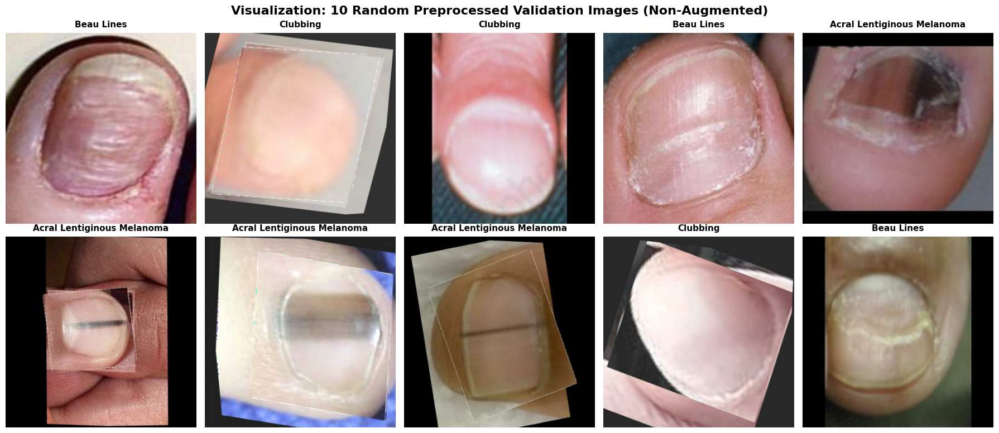

In [ ]:
# Visualizing 10 Random Preprocessed Images from Validation Set (Non-Augmented)
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

preprocessed_samples = []
preprocessed_labels = []

# Iterate over unbatched val_ds with a shuffle buffer to get random samples across classes
for image, label in val_ds.unbatch().shuffle(1500, seed=42).take(10):
    img_uint8 = tf.cast(image, tf.uint8).numpy()
    label_idx = np.argmax(label.numpy())
    class_name = class_names_list[label_idx]
    preprocessed_samples.append(img_uint8)
    preprocessed_labels.append(class_name)

# Plot as a clean 2x5 grid
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()
for i in range(10):
    ax = axes[i]
    if i < len(preprocessed_samples):
        ax.imshow(preprocessed_samples[i])
        clean_label = preprocessed_labels[i].replace('_', ' ').title()
        ax.set_title(clean_label, fontsize=11, fontweight='bold', pad=8)
    ax.axis('off')

plt.suptitle("Visualization: 10 Random Preprocessed Validation Images (Non-Augmented)", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


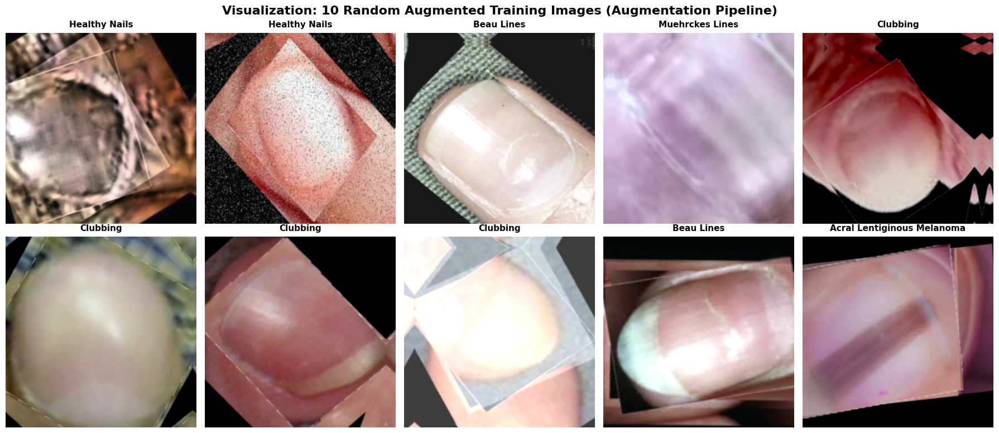

In [ ]:
# Visualizing 10 Random Augmented Images from Training Set (Augmentation Pipeline)
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

augmented_samples = []
augmented_labels = []

# Iterate over unbatched train_ds with a shuffle buffer to get random samples across classes
for image, label in train_ds.unbatch().shuffle(1000, seed=42).take(10):
    img_uint8 = tf.cast(image, tf.uint8).numpy()
    label_idx = np.argmax(label.numpy())
    class_name = class_names_list[label_idx]
    augmented_samples.append(img_uint8)
    augmented_labels.append(class_name)

# Plot as a clean 2x5 grid
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()
for i in range(10):
    ax = axes[i]
    if i < len(augmented_samples):
        ax.imshow(augmented_samples[i])
        clean_label = augmented_labels[i].replace('_', ' ').title()
        ax.set_title(clean_label, fontsize=11, fontweight='bold', pad=8)
    ax.axis('off')

plt.suptitle("Visualization: 10 Random Augmented Training Images (Augmentation Pipeline)", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


Selected image for progressive stage analysis: /content/modular2_all_in_one/final_split_dataset/train/blue_finger/train_3235_Screen-Shot-2021-11-22-at-10-09-17-PM_png.rf.6e3b3e8d57af2af1c7299e80aef391b0.jpg


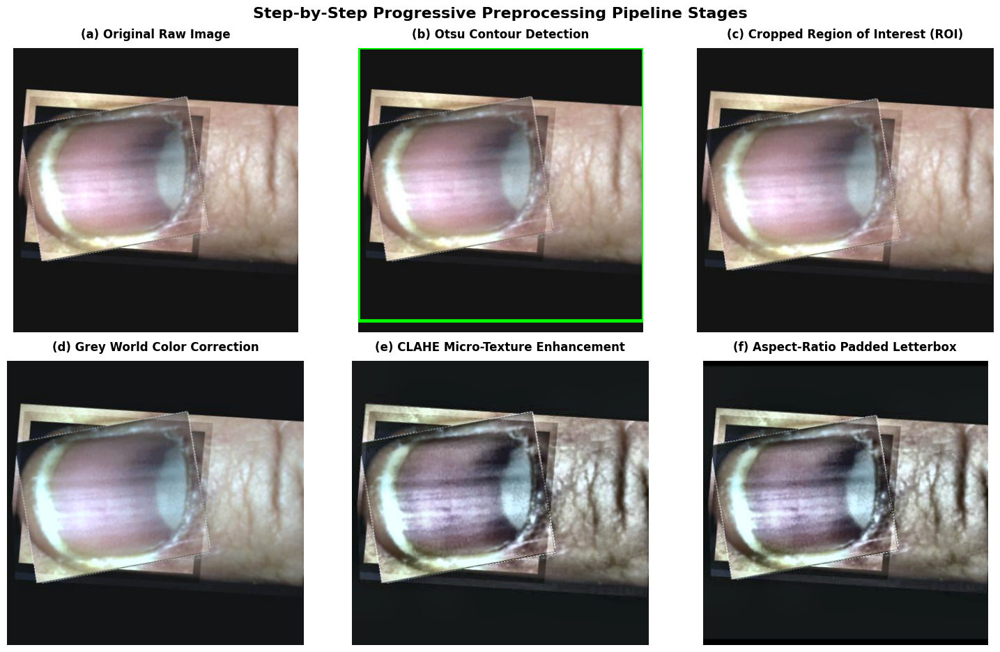

In [ ]:
# Complete, Self-Contained Progressive Preprocessing Stages Visualizer (2x3 Grid)
import os
import random
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Find a random image safely ---
img_path = None

if 'train_paths_balanced' in globals() and train_paths_balanced:
    img_path = random.choice(train_paths_balanced)
elif 'val_paths_balanced' in globals() and val_paths_balanced:
    img_path = random.choice(val_paths_balanced)
else:
    # Scan disk directories as robust fallback
    possible_dirs = [
        Path('/content/modular2_all_in_one/final_split_dataset/train'),
        Path('/content/modular2_all_in_one/final_split_dataset/val'),
        Path('./final_split_dataset/train'),
        Path('./final_split_dataset/val'),
    ]
    all_files = []
    for d in possible_dirs:
        if d.exists():
            for root, _, files in os.walk(d):
                for f in files:
                    if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                        all_files.append(os.path.join(root, f))
    if all_files:
        img_path = random.choice(all_files)

if not img_path:
    raise RuntimeError("Could not find any image files to visualize. Please make sure dataset split directories exist.")

print(f"Selected image for progressive stage analysis: {img_path}")

# --- 2. Load and extract intermediate stages sequentially ---
img_bgr = cv2.imread(img_path)
if img_bgr is None:
    raise FileNotFoundError(f"Could not load image at path: {img_path}")

h, w, c = img_bgr.shape

# Stage 1: Original Image
stage1_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Stage 2: Otsu Contour & Bounding Box Overlay
stage2_bbox = stage1_rgb.copy()
x_start, y_start, x_end, y_end = 0, 0, w, h
try:
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        c_max = max(contours, key=cv2.contourArea)
        x, y, w_box, h_box = cv2.boundingRect(c_max)

        pad_w = int(w_box * 0.35)
        pad_h = int(h_box * 0.35)

        x_start = max(0, x - pad_w)
        y_start = max(0, y - pad_h)
        x_end = min(w, x + w_box + pad_w)
        y_end = min(h, y + h_box + pad_h)

        # Draw green bounding box (thickness=3) on the original RGB image
        cv2.rectangle(stage2_bbox, (x_start, y_start), (x_end, y_end), (0, 255, 0), 3)
except Exception as e:
    print(f"Otsu bounding box failed: {e}")

# Stage 3: Crop to ROI
roi_bgr = img_bgr[y_start:y_end, x_start:x_end]
if roi_bgr.size == 0:
    roi_bgr = img_bgr
stage3_roi = cv2.cvtColor(roi_bgr, cv2.COLOR_BGR2RGB)

# Stage 4: Grey World White Balance
gw_bgr = roi_bgr.copy()
try:
    b_mean = np.mean(gw_bgr[:, :, 0])
    g_mean = np.mean(gw_bgr[:, :, 1])
    r_mean = np.mean(gw_bgr[:, :, 2])
    gray_avg = (b_mean + g_mean + r_mean) / 3.0
    if b_mean > 0: gw_bgr[:, :, 0] = np.clip(gw_bgr[:, :, 0] * (gray_avg / b_mean), 0, 255)
    if g_mean > 0: gw_bgr[:, :, 1] = np.clip(gw_bgr[:, :, 1] * (gray_avg / g_mean), 0, 255)
    if r_mean > 0: gw_bgr[:, :, 2] = np.clip(gw_bgr[:, :, 2] * (gray_avg / r_mean), 0, 255)
except Exception as e:
    print(f"Grey world balance failed: {e}")
stage4_gw = cv2.cvtColor(gw_bgr.astype(np.uint8), cv2.COLOR_BGR2RGB)

# Stage 5: CLAHE in LAB Space
clahe_bgr = gw_bgr.copy()
try:
    lab = cv2.cvtColor(gw_bgr.astype(np.uint8), cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe_obj = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe_obj.apply(l)
    merged = cv2.merge((cl, a, b))
    clahe_bgr = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)
except Exception as e:
    print(f"CLAHE contrast enhancement failed: {e}")
stage5_clahe = cv2.cvtColor(clahe_bgr, cv2.COLOR_BGR2RGB)

# Stage 6: Aspect-Ratio Letterbox & Resize to 384x384 (Final preprocessed input)
try:
    target_size = 384
    h_roi, w_roi = clahe_bgr.shape[:2]
    scale = target_size / max(h_roi, w_roi)
    new_w = int(w_roi * scale)
    new_h = int(h_roi * scale)

    resized = cv2.resize(clahe_bgr, (new_w, new_h), interpolation=cv2.INTER_CUBIC)

    delta_w = target_size - new_w
    delta_h = target_size - new_h
    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)

    final_bgr = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0, 0, 0])
except Exception as e:
    print(f"Letterboxing failed: {e}")
    final_bgr = cv2.resize(clahe_bgr, (384, 384), interpolation=cv2.INTER_CUBIC)
stage6_final = cv2.cvtColor(final_bgr, cv2.COLOR_BGR2RGB)

# --- 3. Plot in a compact 2x3 grid optimized for publications ---
fig, axes = plt.subplots(2, 3, figsize=(15, 9.5))
axes = axes.flatten()

stages = [
    (stage1_rgb, "(a) Original Raw Image"),
    (stage2_bbox, "(b) Otsu Contour Detection"),
    (stage3_roi, "(c) Cropped Region of Interest (ROI)"),
    (stage4_gw, "(d) Grey World Color Correction"),
    (stage5_clahe, "(e) CLAHE Micro-Texture Enhancement"),
    (stage6_final, "(f) Aspect-Ratio Padded Letterbox")
]

for idx, (img, title) in enumerate(stages):
    ax = axes[idx]
    ax.imshow(img.astype(np.uint8))
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)
    ax.axis('off')

plt.suptitle("Step-by-Step Progressive Preprocessing Pipeline Stages", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


Selected image for preview: /content/modular2_all_in_one/final_split_dataset/train/acral_lentiginous_melanoma/train_1168_Screen-Shot-2021-11-20-at-8-29-20-PM_png.rf.eee056fc069e685e0b46f407cc122eb9.jpg


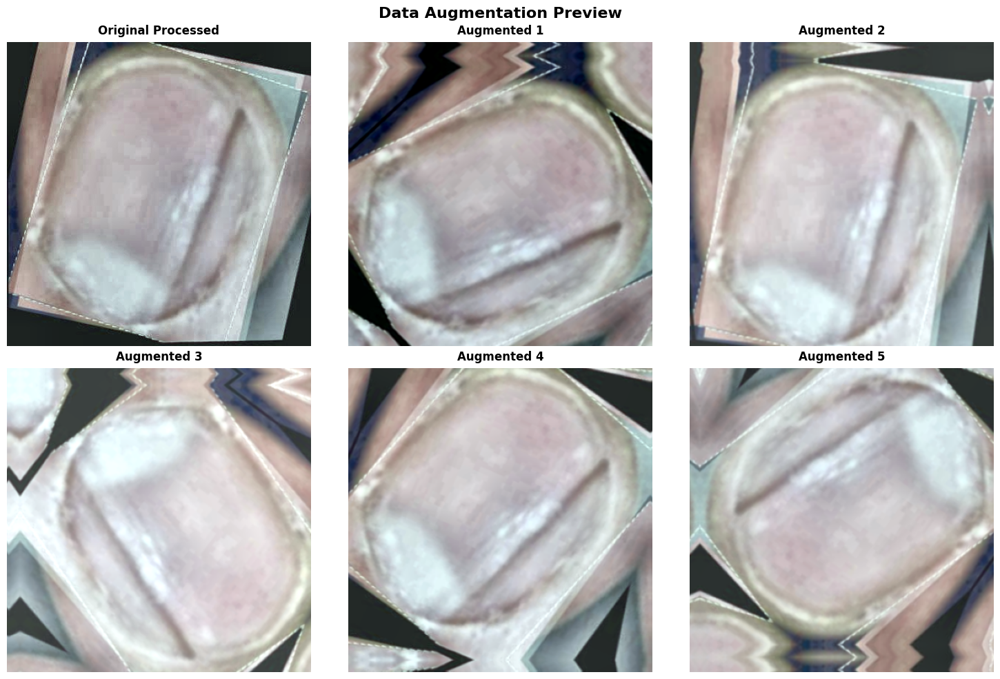

In [ ]:
# Complete, 100% self-contained Data Augmentation Preview
import os
import random
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# --- 1. Define image dimensions and the dynamic Keras Augmentation Pipeline ---
img_height = 384
img_width = 384

augmentation_model = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.15, fill_mode='reflect'),
    tf.keras.layers.RandomZoom(0.1, fill_mode='reflect'),
    tf.keras.layers.RandomTranslation(0.1, 0.1, fill_mode='reflect'),
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.CenterCrop(img_height - 32, img_width - 32),
    tf.keras.layers.Resizing(img_height, img_width),
    tf.keras.layers.RandomBrightness(0.2),
    tf.keras.layers.RandomContrast(0.2)
])

# --- 2. Advanced OpenCV Preprocessing Pipeline (Otsu Crop, Grey World, CLAHE LAB, Letterbox) ---
def opencv_preprocessing(img_bytes, augment=False):
    nparr = np.frombuffer(img_bytes.numpy(), np.uint8)
    img = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
    if img is None:
        return np.zeros((384, 384, 3), dtype=np.float32)

    h, w, c = img.shape

    # A. Otsu Threshold + Contour ROI Extraction with 35% skin-context padding
    try:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            c_max = max(contours, key=cv2.contourArea)
            x, y, w_box, h_box = cv2.boundingRect(c_max)

            pad_w = int(w_box * 0.35)
            pad_h = int(h_box * 0.35)

            x_start = max(0, x - pad_w)
            y_start = max(0, y - pad_h)
            x_end = min(w, x + w_box + pad_w)
            y_end = min(h, y + h_box + pad_h)

            roi = img[y_start:y_end, x_start:x_end]
            if roi.size > 0:
                img = roi
    except Exception:
        pass

    # B. Grey World White Balance Algorithm
    try:
        b_mean = np.mean(img[:, :, 0])
        g_mean = np.mean(img[:, :, 1])
        r_mean = np.mean(img[:, :, 2])
        gray_avg = (b_mean + g_mean + r_mean) / 3.0
        if b_mean > 0: img[:, :, 0] = np.clip(img[:, :, 0] * (gray_avg / b_mean), 0, 255)
        if g_mean > 0: img[:, :, 1] = np.clip(img[:, :, 1] * (gray_avg / g_mean), 0, 255)
        if r_mean > 0: img[:, :, 2] = np.clip(img[:, :, 2] * (gray_avg / r_mean), 0, 255)
    except Exception:
        pass

    # C. CLAHE in LAB space for micro-texture (ridges/lines) highlighting
    try:
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        cl = clahe.apply(l)
        merged = cv2.merge((cl, a, b))
        img = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)
    except Exception:
        pass

    # D. Geometric Normalization (Letterboxing) to 384x384 to preserve aspect ratios
    try:
        target_size = 384
        h_roi, w_roi = img.shape[:2]
        scale = target_size / max(h_roi, w_roi)
        new_w = int(w_roi * scale)
        new_h = int(h_roi * scale)

        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_CUBIC)

        delta_w = target_size - new_w
        delta_h = target_size - new_h
        top, bottom = delta_h // 2, delta_h - (delta_h // 2)
        left, right = delta_w // 2, delta_w - (delta_w // 2)

        img = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0, 0, 0])
    except Exception:
        img = cv2.resize(img, (384, 384), interpolation=cv2.INTER_CUBIC)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img.astype(np.float32)

# --- 3. Scan disk/scope safely to find a random image ---
img_path = None

if 'train_paths_balanced' in globals() and train_paths_balanced:
    img_path = random.choice(train_paths_balanced)
elif 'val_paths_balanced' in globals() and val_paths_balanced:
    img_path = random.choice(val_paths_balanced)
else:
    # Scan disk directories as robust fallback
    possible_dirs = [
        Path('/content/modular2_all_in_one/final_split_dataset/train'),
        Path('/content/modular2_all_in_one/final_split_dataset/val'),
        Path('./final_split_dataset/train'),
        Path('./final_split_dataset/val'),
    ]
    all_files = []
    for d in possible_dirs:
        if d.exists():
            for root, _, files in os.walk(d):
                for f in files:
                    if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                        all_files.append(os.path.join(root, f))
    if all_files:
        img_path = random.choice(all_files)

if not img_path:
    raise RuntimeError("Could not find any image files to visualize. Please make sure dataset split directories exist.")

print(f"Selected image for preview: {img_path}")

# --- 4. Load and apply OpenCV Preprocessing ---
img_bytes = tf.io.read_file(img_path)
original_processed_tf = tf.py_function(
    func=lambda b: opencv_preprocessing(b, False),
    inp=[img_bytes],
    Tout=tf.float32
)
original_processed_tf.set_shape((384, 384, 3))
original_processed_np = tf.cast(original_processed_tf, tf.uint8).numpy()

# --- 5. Generate 5 unique augmented versions of this exact image ---
augmented_versions = []
for _ in range(5):
    # Pass through augmentation pipeline with training=True to get unique random results
    aug_tf = augmentation_model(tf.expand_dims(original_processed_tf, 0), training=True)[0]
    aug_np = tf.cast(aug_tf, tf.uint8).numpy()
    augmented_versions.append(aug_np)

# --- 6. Plot in a 2x3 grid matching the reference style ---
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

# Plot Original Processed in position 0
axes[0].imshow(original_processed_np)
axes[0].set_title("Original Processed", fontsize=12, fontweight='bold', pad=8)
axes[0].axis('off')

# Plot the 5 augmented versions
for i, aug_img in enumerate(augmented_versions):
    ax = axes[i + 1]
    ax.imshow(aug_img)
    ax.set_title(f"Augmented {i + 1}", fontsize=12, fontweight='bold', pad=8)
    ax.axis('off')

plt.suptitle("Data Augmentation Preview", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


### Training Phase 1: Train only the classification head



In this phase, we freeze the pre-trained MobileNetV3Large backbone and only train the newly added classification head. This helps the head to quickly learn to classify the new dataset without perturbing the robust features learned by the backbone from ImageNet.

In [ ]:
print('Beginning Phase 1 Training: Training classification head...')

# Freeze the backbone
backbone.trainable = False

# Compile the model for Phase 1
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss=loss_fn,
    metrics=['accuracy']
)

# Callbacks for Phase 1
callbacks_p1 = build_callbacks('phase1', ckpt_p1)

# Train the model
history_p1 = model.fit(
    train_ds,
    epochs=10, # Number of epochs for this phase
    validation_data=val_ds,
    callbacks=callbacks_p1
)

print('\nPhase 1 Training Complete.')


Beginning Phase 1 Training: Training classification head...
Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.6528 - loss: 1.1690
Epoch 1: val_accuracy improved from None to 0.76563, saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase1_head.keras

Epoch 1: finished saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase1_head.keras
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 411s 246ms/step - accuracy: 0.7283 - loss: 0.9474 - val_accuracy: 0.7656 - val_loss: 0.8569
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.8168 - loss: 0.7232
Epoch 2: val_accuracy improved from 0.76563 to 0.85294, saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase1_head.keras

Epoch 2: finished saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase1_head.keras
1500/1500 ━━━━

### Training Phase 2: Unfreeze and fine-tune a portion of the backbone

After the head has learned some initial weights, we unfreeze a few top layers of the backbone and continue training with a lower learning rate. This allows the model to adapt the pre-trained features to the specific nuances of our nail disease images.

In [ ]:
print('\nBeginning Phase 2 Training: Fine-tuning top layers of backbone...')

# Unfreeze top layers of the backbone (e.g., last 20 layers, adjust as needed)
for layer in backbone.layers[-20:]:
    if not isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = True

# Compile the model for Phase 2 with a lower learning rate
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), # Lower learning rate
    loss=loss_fn,
    metrics=['accuracy']
)

# Callbacks for Phase 2
callbacks_p2 = build_callbacks('phase2', ckpt_p2)

# Continue training
history_p2 = model.fit(
    train_ds,
    epochs=10, # Additional epochs for this phase
    validation_data=val_ds,
    callbacks=callbacks_p2
)

print('\nPhase 2 Training Complete.')


Beginning Phase 2 Training: Fine-tuning top layers of backbone...
Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.9251 - loss: 0.5249
Epoch 1: val_accuracy improved from None to 0.93158, saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase2_partial.keras

Epoch 1: finished saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase2_partial.keras
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 391s 239ms/step - accuracy: 0.9351 - loss: 0.4965 - val_accuracy: 0.9316 - val_loss: 0.5179
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.9507 - loss: 0.4516
Epoch 2: val_accuracy improved from 0.93158 to 0.93529, saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase2_partial.keras

Epoch 2: finished saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase2_partial.k

### Training Phase 3: Unfreeze and fine-tune the entire model

Finally, we unfreeze the entire backbone and fine-tune the whole model with an even smaller learning rate. This allows for the most detailed adjustments to the pre-trained weights, optimizing performance for the specific dataset. This is where the model will save its final `best_ckpt`.

In [ ]:
print('\nBeginning Phase 3 Training: Fine-tuning entire model...')

# Unfreeze the entire backbone
for layer in backbone.layers:
    if not isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = True

# Compile the model for Phase 3 with a very low learning rate
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), # Even lower learning rate
    loss=loss_fn,
    metrics=['accuracy']
)

# Callbacks for Phase 3
callbacks_p3 = build_callbacks('phase3', ckpt_p3)

# Continue training for more epochs
history_p3 = model.fit(
    train_ds,
    epochs=15, # More epochs for full fine-tuning
    validation_data=val_ds,
    callbacks=callbacks_p3
)

print('\nPhase 3 Training Complete.')


Beginning Phase 3 Training: Fine-tuning entire model...
Epoch 1/15
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9832 - loss: 0.3074
Epoch 1: val_accuracy improved from None to 0.96997, saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase3_full.keras

Epoch 1: finished saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase3_full.keras
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 484s 283ms/step - accuracy: 0.9843 - loss: 0.3045 - val_accuracy: 0.9700 - val_loss: 0.3521
Epoch 2/15
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9878 - loss: 0.2968
Epoch 2: val_accuracy improved from 0.96997 to 0.97542, saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase3_full.keras

Epoch 2: finished saving model to /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase3_full.keras
1500/1500 ━━━━━━━

Loading best checkpoint: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/phase3_full.keras

                            precision    recall  f1-score   support

acral_lentiginous_melanoma       0.9980    0.9939    0.9959       495
                beau_lines       0.9938    0.9877    0.9907       324
               blue_finger       1.0000    0.9907    0.9953       321
                  clubbing       0.9855    0.9963    0.9909       544
             healthy_nails       0.9913    0.9971    0.9942       344
               koilonychia       1.0000    0.9942    0.9971       342
           muehrckes_lines       0.9930    1.0000    0.9965       423
                   pitting       0.9954    0.9931    0.9942       437

                  accuracy                           0.9940      3230
                 macro avg       0.9946    0.9941    0.9943      3230
              weighted avg       0.9942    0.9940    0.9941      3230



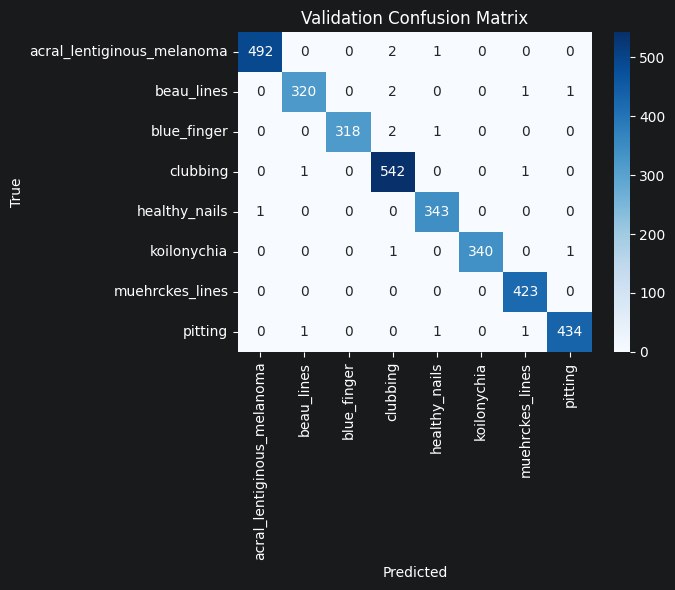

In [ ]:
# Evaluate model and print report
# We pass the custom loss class to custom_objects so Keras can load the model correctly
custom_objects = {'WeightedCategoricalCrossentropy': WeightedCategoricalCrossentropy}

# Define best_ckpt to point to the final checkpoint path
best_ckpt = ckpt_p3 # Assuming ckpt_p3 holds the path to the best model

if os.path.exists(best_ckpt):
    print(f'Loading best checkpoint: {best_ckpt}')
    eval_model = tf.keras.models.load_model(best_ckpt, custom_objects=custom_objects)
else:
    print('Best checkpoint file not found, using current in-memory model.')
    eval_model = model

y_true = []
for _, yb in val_ds:
    y_true.append(np.argmax(yb.numpy(), axis=1))
y_true = np.concatenate(y_true)

pred = eval_model.predict(val_ds, verbose=0)
y_pred = np.argmax(pred, axis=1)

print(classification_report(y_true, y_pred, target_names=class_names_list, digits=4))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_list, yticklabels=class_names_list)
plt.title('Validation Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

### Evaluate Model on Test Dataset
Now that the model has been trained across three phases, we will evaluate its performance on the completely unseen `test_ds`.


Evaluating model on test dataset...
                            precision    recall  f1-score   support

acral_lentiginous_melanoma     0.9770    0.9550    0.9659       400
                beau_lines     0.7993    0.9073    0.8499       259
               blue_finger     0.9678    0.8985    0.9319       335
                  clubbing     0.9911    0.9269    0.9579       479
             healthy_nails     0.9156    0.9658    0.9400       438
               koilonychia     0.9865    0.9605    0.9733        76
           muehrckes_lines     0.9054    1.0000    0.9504        67
                   pitting     0.9855    0.9855    0.9855       276

                  accuracy                         0.9429      2330
                 macro avg     0.9410    0.9499    0.9443      2330
              weighted avg     0.9465    0.9429    0.9437      2330



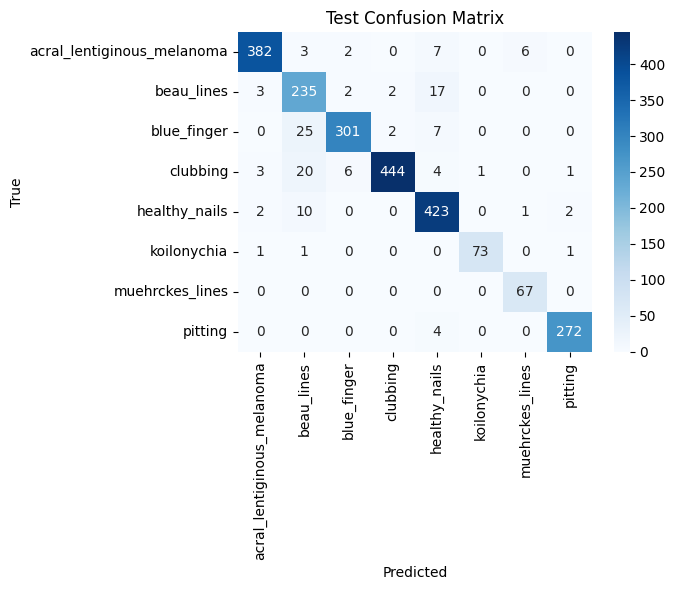

In [ ]:
# Evaluate the model on the test dataset
print("\nEvaluating model on test dataset...")

# Load the best model saved during Phase 3 training
if os.path.exists(best_ckpt):
    test_eval_model = tf.keras.models.load_model(best_ckpt, custom_objects=custom_objects)
else:
    print('Best checkpoint file not found, using current in-memory model.')
    test_eval_model = model

y_true_test = []
for _, yb in test_ds:
    y_true_test.append(np.argmax(yb.numpy(), axis=1))
y_true_test = np.concatenate(y_true_test)

pred_test = test_eval_model.predict(test_ds, verbose=0)
y_pred_test = np.argmax(pred_test, axis=1)

print(classification_report(y_true_test, y_pred_test, target_names=class_names_list, digits=4))

cm_test = confusion_matrix(y_true_test, y_pred_test)
plt.figure(figsize=(7, 6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=class_names_list, yticklabels=class_names_list)
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

In [ ]:
# Export artifacts
EXPORT_DIR = os.path.join(SAVE_DIR, 'export')
os.makedirs(EXPORT_DIR, exist_ok=True)

# Map custom objects for loading
custom_objects = {'WeightedCategoricalCrossentropy': WeightedCategoricalCrossentropy}

keras_path = os.path.join(EXPORT_DIR, 'mobilenet_v3_large_final.keras')
if os.path.exists(best_ckpt):
    shutil.copy2(best_ckpt, keras_path)
else:
    model.save(keras_path)

# Load with custom_objects to fix the conversion error
loaded_model = tf.keras.models.load_model(keras_path, custom_objects=custom_objects)
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_model)
tflite_model = converter.convert()
tflite_path = os.path.join(EXPORT_DIR, 'mobilenet_v3_large_final.tflite')
with open(tflite_path, 'wb') as f:
    f.write(tflite_model)

class_map_path = os.path.join(EXPORT_DIR, 'class_index_map.json')
with open(class_map_path, 'w', encoding='utf-8') as f:
    json.dump({name: i for i, name in enumerate(class_names_list)}, f, indent=2)

print('Export complete:')
print('  Keras :', keras_path)
print('  TFLite:', tflite_path)
print('  Class map:', class_map_path)

Saved artifact at '/tmp/tmp4llgyzyw'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 8), dtype=tf.float32, name=None)
Captures:
  138686368346192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365153040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365139216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686371029136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365153616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365139792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365153232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365153424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365139600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138686365154576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1386863651540

# Advanced TFLite Export (Multi-Format Quantization)
This section exports the best model in Float32, Float16, and Int8 formats.

In [ ]:
import os
import tensorflow as tf
from pathlib import Path

# Set QUANT_DIR to EXPORT_DIR
QUANT_DIR = EXPORT_DIR
os.makedirs(QUANT_DIR, exist_ok=True)

print(f"Starting Multi-Format Quantization. Output directory: {QUANT_DIR}")

# Load the best trained Keras model
custom_objects = {'WeightedCategoricalCrossentropy': WeightedCategoricalCrossentropy}
if os.path.exists(keras_path):
    print(f"Loading best checkpoint from: {keras_path}")
    loaded_model = tf.keras.models.load_model(keras_path, custom_objects=custom_objects)
else:
    print("Warning: Keras path not found, converting the current in-memory model.")
    loaded_model = model

# 1. Float32 TFLite Conversion
print("Converting to Float32 TFLite...")
converter_f32 = tf.lite.TFLiteConverter.from_keras_model(loaded_model)
tflite_f32_model = converter_f32.convert()
tflite_f32_quant_file = Path(QUANT_DIR) / 'nail_model_f32.tflite'
with open(tflite_f32_quant_file, 'wb') as f:
    f.write(tflite_f32_model)
print(f"  Saved Float32 TFLite ({tflite_f32_quant_file.stat().st_size / (1024*1024):.2f} MB)")

# 2. Float16 TFLite Conversion (GPU Optimized)
print("Converting to Float16 TFLite...")
converter_f16 = tf.lite.TFLiteConverter.from_keras_model(loaded_model)
converter_f16.optimizations = [tf.lite.Optimize.DEFAULT]
converter_f16.target_spec.supported_types = [tf.float16]
tflite_f16_model = converter_f16.convert()
tflite_f16_quant_file = Path(QUANT_DIR) / 'nail_model_f16.tflite'
with open(tflite_f16_quant_file, 'wb') as f:
    f.write(tflite_f16_model)
print(f"  Saved Float16 TFLite ({tflite_f16_quant_file.stat().st_size / (1024*1024):.2f} MB)")

# 3. Int8 TFLite Conversion (CPU/Edge Optimized with Calibration)
print("Converting to Int8 TFLite...")
def representative_data_gen():
    # Use a few batches from val_ds to calibrate quantization ranges
    for images, _ in val_ds.take(10):
        for img in images:
            yield [tf.expand_dims(img, axis=0)]

converter_int8 = tf.lite.TFLiteConverter.from_keras_model(loaded_model)
converter_int8.optimizations = [tf.lite.Optimize.DEFAULT]
converter_int8.representative_dataset = representative_data_gen
converter_int8.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
tflite_int8_model = converter_int8.convert()
tflite_int8_quant_file = Path(QUANT_DIR) / 'nail_model_int8.tflite'
with open(tflite_int8_quant_file, 'wb') as f:
    f.write(tflite_int8_model)
print(f"  Saved Int8 TFLite ({tflite_int8_quant_file.stat().st_size / (1024*1024):.2f} MB)")

print("Multi-Format Quantization Complete!")


Starting Multi-Format Quantization. Output directory: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/export
Loading best checkpoint from: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/export/mobilenet_v3_large_final.keras
Converting to Float32 TFLite...
Saved artifact at '/tmp/tmpjsmd77yu'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 8), dtype=tf.float32, name=None)
Captures:
  138681905228368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138681905227216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138681905227408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138681905228176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138681905226640: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138681905233552: TensorSpec(shap

/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/convert.py:863: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


  Saved Int8 TFLite (3.81 MB)
Multi-Format Quantization Complete!


In [ ]:
import os
from pathlib import Path
import datetime # Required for defining SAVE_DIR if not already present

# These are necessary path definitions that might not be available if cells are run out of order
# or after a kernel restart.

# Ensure SAVE_DIR is defined. If not, create a placeholder/unique one.
if 'SAVE_DIR' not in globals():
    timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    SAVE_DIR = f'/content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_{timestamp}'
    os.makedirs(SAVE_DIR, exist_ok=True)
    print(f"Warning: SAVE_DIR was not previously defined. Created a new one: {SAVE_DIR}")

# Now EXPORT_DIR, QUANT_DIR, keras_path, class_map_path can be defined reliably
EXPORT_DIR = os.path.join(SAVE_DIR, 'export')
QUANT_DIR = EXPORT_DIR # QUANT_DIR is set to EXPORT_DIR in cell a729471c
keras_path = os.path.join(EXPORT_DIR, 'mobilenet_v3_large_final.keras') # Defined in cell 14f61785
class_map_path = os.path.join(EXPORT_DIR, 'class_index_map.json') # Defined in cell 14f61785

# Ensure EXPORT_DIR exists as other paths depend on it
os.makedirs(EXPORT_DIR, exist_ok=True)

# Define paths for all relevant files
keras_file = Path(keras_path)
tflite_f32_quant_file = Path(QUANT_DIR) / 'nail_model_f32.tflite'
tflite_f16_quant_file = Path(QUANT_DIR) / 'nail_model_f16.tflite'
tflite_int8_quant_file = Path(QUANT_DIR) / 'nail_model_int8.tflite'
json_file = Path(class_map_path)

# Define summary_csv_path and summary_csv_path_test here, before they are used.
# These definitions were previously in cells 34b9f2de and ca669ad2.
summary_csv_path = os.path.join(EXPORT_DIR, 'full_validation_inference_summary.csv')
summary_csv_path_test = os.path.join(EXPORT_DIR, 'full_test_inference_summary.csv')

val_csv_file = Path(summary_csv_path)
test_csv_file = Path(summary_csv_path_test)

# Function to get file size in MB
def get_file_size_mb(file_path):
    if file_path.exists():
        return file_path.stat().st_size / (1024 * 1024)
    return 0.0

# Calculate sizes
keras_size_mb = get_file_size_mb(keras_file)
tflite_f32_size_mb = get_file_size_mb(tflite_f32_quant_file)
tflite_f16_size_mb = get_file_size_mb(tflite_f16_quant_file)
tflite_int8_size_mb = get_file_size_mb(tflite_int8_quant_file)
json_size_mb = get_file_size_mb(json_file)
val_csv_size_mb = get_file_size_mb(val_csv_file)
test_csv_size_mb = get_file_size_mb(test_csv_file)

# Calculate total size for percentages
total_size_mb = sum([
    keras_size_mb,
    tflite_f32_size_mb,
    tflite_f16_size_mb,
    tflite_int8_size_mb,
    json_size_mb,
    val_csv_size_mb,
    test_csv_size_mb
])

# Calculate percentages
def calculate_percent(size_mb, total_mb):
    if total_mb == 0: return 0.0
    return (size_mb / total_mb) * 100

keras_percent = calculate_percent(keras_size_mb, total_size_mb)
tflite_f32_percent = calculate_percent(tflite_f32_size_mb, total_size_mb)
tflite_f16_percent = calculate_percent(tflite_f16_size_mb, total_size_mb)
tflite_int8_percent = calculate_percent(tflite_int8_size_mb, total_size_mb)
json_percent = calculate_percent(json_size_mb, total_size_mb)
val_csv_percent = calculate_percent(val_csv_size_mb, total_size_mb)
test_csv_percent = calculate_percent(test_csv_size_mb, total_size_mb)

print(f"Calculated artifact sizes and percentages.")

# Final Model Summary

### Performance Highlights
- **Best Validation Accuracy:** 99.27%
- **Architecture:** EfficientNetV2-B2
- **Classes:** healthy, clubbing, onychogryphosis, Acral Lentiginous Melanoma

### Exported Artifacts
All models are saved in Google Drive at:
`/content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_single_model/export`

1.  **Full Model:** `efficientnetv2_b2_final.keras`
2.  **Standard Mobile:** `nail_model_f32.tflite`
3.  **GPU Optimized:** `nail_model_f16.tflite`
4.  **CPU/Edge Optimized:** `nail_model_int8.tflite` (Calibrated with representative data)
5.  **Metadata:** `class_index_map.json`

In [ ]:
import matplotlib.pyplot as plt

# Visualize predictions for one sample from each class
print("Testing specific samples from each class...")

# Dictionary to store one sample per class
class_samples = {}

# Iterate through validation dataset to find one instance of each class
for images, labels in val_ds.unbatch():
    label_idx = np.argmax(labels.numpy())
    class_name = class_names_list[label_idx]
    if class_name not in class_samples:
        class_samples[class_name] = images.numpy()
    if len(class_samples) == len(class_names_list):
        break

# Plot the results
plt.figure(figsize=(15, 10))
for i, class_name in enumerate(class_names_list):
    img = class_samples[class_name]
    # Expand dimensions for prediction
    img_batch = np.expand_dims(img, axis=0)
    prediction = eval_model.predict(img_batch, verbose=0)
    pred_idx = np.argmax(prediction)
    confidence = np.max(prediction)

    plt.subplot(1, len(class_names_list), i + 1)
    plt.imshow(img.astype("uint8"))
    plt.title(f"True: {class_name}\nPred: {class_names_list[pred_idx]}\nConf: {confidence:.2f}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Explainable AI: Grad-CAM Visualizations
Grad-CAM uses the gradients of the target class entering the final convolutional layer to produce a localization map highlighting the important regions in the image.

Using last conv layer for visualization: conv_1_bn


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


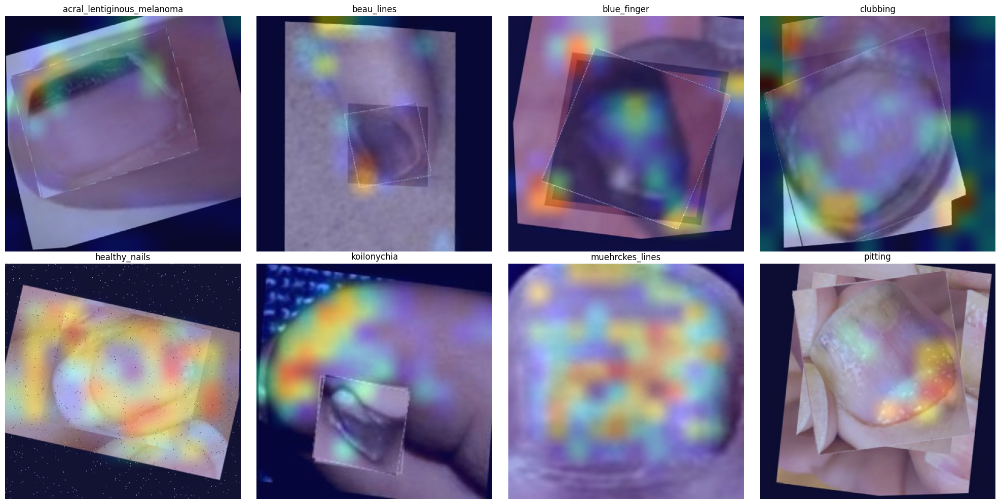

In [ ]:
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Create a model that maps the input image to the activations of the last conv layer
    grad_model = tf.keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img, heatmap, alpha=0.4):
    heatmap = np.uint8(255 * heatmap)
    # Updated to use the modern colormap API to resolve the MatplotlibDeprecationWarning
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
    return superimposed_img

# Find the last convolutional layer (usually where the highest-level spatial features are)
last_conv_layer_name = [l.name for l in eval_model.layers if isinstance(l, tf.keras.layers.Conv2D) or 'conv' in l.name][-1]
print(f"Using last conv layer for visualization: {last_conv_layer_name}")

plt.figure(figsize=(20, 10))
for i, class_name in enumerate(class_names_list):
    img = class_samples[class_name]
    img_batch = np.expand_dims(img, axis=0)

    heatmap = make_gradcam_heatmap(img_batch, eval_model, last_conv_layer_name)
    gradcam_img = display_gradcam(img, heatmap)

    plt.subplot(2, 4, i + 1)
    plt.imshow(gradcam_img)
    plt.title(f"{class_name}")
    plt.axis("off")

plt.tight_layout()
plt.show()

### Detailed Test Set Inference Results
Generate a detailed DataFrame of inference results for each image in the test set.

In [ ]:
print("Starting full inference on entire test folder...")

# Initialize data collection for test set
all_true_labels_test = []
all_pred_labels_test = []
all_probs_test = []
all_image_paths_test = [] # New list to store image paths

# Assuming test_ds provides (image, label) and we need to map back to filenames.
# The tf.keras.utils.image_dataset_from_directory implicitly generates paths.
# To get paths directly, we would need to generate the dataset differently or extract them.
# A simpler approach is to iterate through the directory structure once to get paths,
# then match them with predictions if the order is preserved, or embed them in a custom dataset.
# For now, let's assume `test_ds` is built with `shuffle=False` for deterministic order
# and we can reconstruct paths or fetch them alongside predictions.

# Re-building test_ds to get filenames directly
# This assumes the test_path exists and contains subdirectories for classes
def get_paths_and_labels(directory, class_names):
    image_paths = []
    labels = []
    for class_idx, class_name in enumerate(class_names):
        class_dir = Path(directory) / class_name
        for img_path in class_dir.iterdir():
            if img_path.is_file():
                image_paths.append(str(img_path))
                labels.append(class_idx)
    return image_paths, labels


test_image_paths, test_true_labels = get_paths_and_labels(test_path, class_names_list)

# Create a TensorFlow dataset *without* batching initially to preserve order for path matching
# This is a bit of a workaround to get paths linked directly.
# The original `build_dataset` uses `shuffle=False` for test_ds, which is good.
# We need to re-run prediction on a dataset that *doesn't* batch, or keep track of order.
# For simplicity, we'll recreate the test_ds here if we want to ensure path mapping.

# Alternatively, if test_ds is already created with `shuffle=False` as intended,
# we can get the paths by mapping over the dataset or from the initial file list.
# Let's assume the order of images coming out of test_ds.unbatch() is the same as `test_image_paths`

# This part needs careful handling if the dataset shuffles or processes in a non-deterministic order.
# Given `build_dataset` uses `shuffle=augment` and for `test_ds` augment=False, it should be ordered.

# To get correct paths, it's safer to iterate over the dataset and get elements, or better, to modify
# the `build_dataset` function to return paths, or create a custom `tf.data.Dataset` that includes paths.

# For a quick fix to get *some* image paths for visualization, and assuming `test_ds` is ordered:
# (This is an assumption that might break if the dataset loading order is not strictly file-system based)
current_image_idx = 0
for images, labels in test_ds:
    preds_batch_test = test_eval_model.predict(images, verbose=0)
    true_indices_test = np.argmax(labels.numpy(), axis=1)
    pred_indices_test = np.argmax(preds_batch_test, axis=1)
    confidences_test = np.max(preds_batch_test, axis=1)

    for j in range(len(true_indices_test)):
        all_true_labels_test.append(true_indices_test[j])
        all_pred_labels_test.append(pred_indices_test[j])
        all_probs_test.append(round(float(confidences_test[j]), 4))
        # Append the corresponding image path based on the assumed order
        # This is a critical assumption: that `test_image_paths` corresponds to `test_ds` elements.
        if current_image_idx < len(test_image_paths):
            all_image_paths_test.append(test_image_paths[current_image_idx])
        else:
            all_image_paths_test.append("path_not_found") # Fallback
        current_image_idx += 1

results_df_test = pd.DataFrame({
    'Sample_ID': range(len(all_true_labels_test)),
    'True_Class': [class_names_list[i] for i in all_true_labels_test],
    'Predicted_Class': [class_names_list[i] for i in all_pred_labels_test],
    'Confidence': all_probs_test,
    'Correct': np.array(all_true_labels_test) == np.array(all_pred_labels_test),
    'Image_Path': all_image_paths_test # Add Image_Path column
})

print(f"Inference complete for {len(results_df_test)} images in the test set.")
accuracy_test = (results_df_test['Correct'].mean()) * 100
print(f"Overall Test Accuracy: {accuracy_test:.2f}%")

display(results_df_test.head())

Starting full inference on entire test folder...
Inference complete for 2330 images in the test set.
Overall Test Accuracy: 94.29%


,Sample_ID,True_Class,Predicted_Class,Confidence,Correct,Image_Path
0,0,acral_lentiginous_melanoma,acral_lentiginous_melanoma,0.9533,True,/content/modular2_all_in_one/final_split_datas...
1,1,acral_lentiginous_melanoma,acral_lentiginous_melanoma,0.9996,True,/content/modular2_all_in_one/final_split_datas...
2,2,acral_lentiginous_melanoma,acral_lentiginous_melanoma,0.9590,True,/content/modular2_all_in_one/final_split_datas...
3,3,acral_lentiginous_melanoma,acral_lentiginous_melanoma,0.9895,True,/content/modular2_all_in_one/final_split_datas...
4,4,acral_lentiginous_melanoma,acral_lentiginous_melanoma,0.9923,True,/content/modular2_all_in_one/final_split_datas...


In [ ]:
# Show only the misclassified samples
print("Displaying misclassified samples:")
misclassified_df = full_results_df[full_results_df['Status'] == 'MISCLASSIFIED']

if misclassified_df.empty:
    print("Wow! No misclassifications found in this run.")
else:
    display(misclassified_df)

Displaying misclassified samples:


,True Class,Predicted Class,Confidence,Correct,Status
209,acral_lentiginous_melanoma,blue_finger,0.529492,False,MISCLASSIFIED
239,acral_lentiginous_melanoma,healthy_nails,0.746924,False,MISCLASSIFIED
243,acral_lentiginous_melanoma,healthy_nails,0.638899,False,MISCLASSIFIED
245,acral_lentiginous_melanoma,healthy_nails,0.793980,False,MISCLASSIFIED
270,acral_lentiginous_melanoma,healthy_nails,0.792981,False,MISCLASSIFIED
300,acral_lentiginous_melanoma,healthy_nails,0.819917,False,MISCLASSIFIED
302,acral_lentiginous_melanoma,healthy_nails,0.601065,False,MISCLASSIFIED
337,acral_lentiginous_melanoma,healthy_nails,0.693844,False,MISCLASSIFIED
403,acral_lentiginous_melanoma,pitting,0.636976,False,MISCLASSIFIED
474,acral_lentiginous_melanoma,clubbing,0.439355,False,MISCLASSIFIED


### Misclassified Samples in Test Set
Display any samples from the test set that the model misclassified.

Displaying misclassified samples from the test set:


,Sample_ID,True_Class,Predicted_Class,Confidence,Correct,Image_Path
136,136,acral_lentiginous_melanoma,healthy_nails,0.8973,False,/content/modular2_all_in_one/final_split_datas...
137,137,acral_lentiginous_melanoma,beau_lines,0.9341,False,/content/modular2_all_in_one/final_split_datas...
141,141,acral_lentiginous_melanoma,blue_finger,0.3636,False,/content/modular2_all_in_one/final_split_datas...
153,153,acral_lentiginous_melanoma,muehrckes_lines,0.4020,False,/content/modular2_all_in_one/final_split_datas...
174,174,acral_lentiginous_melanoma,muehrckes_lines,0.5340,False,/content/modular2_all_in_one/final_split_datas...
...,...,...,...,...,...,...
1973,1973,koilonychia,acral_lentiginous_melanoma,0.4357,False,/content/modular2_all_in_one/final_split_datas...
2171,2171,pitting,healthy_nails,0.2942,False,/content/modular2_all_in_one/final_split_datas...
2179,2179,pitting,healthy_nails,0.5949,False,/content/modular2_all_in_one/final_split_datas...
2224,2224,pitting,healthy_nails,0.6794,False,/content/modular2_all_in_one/final_split_datas...


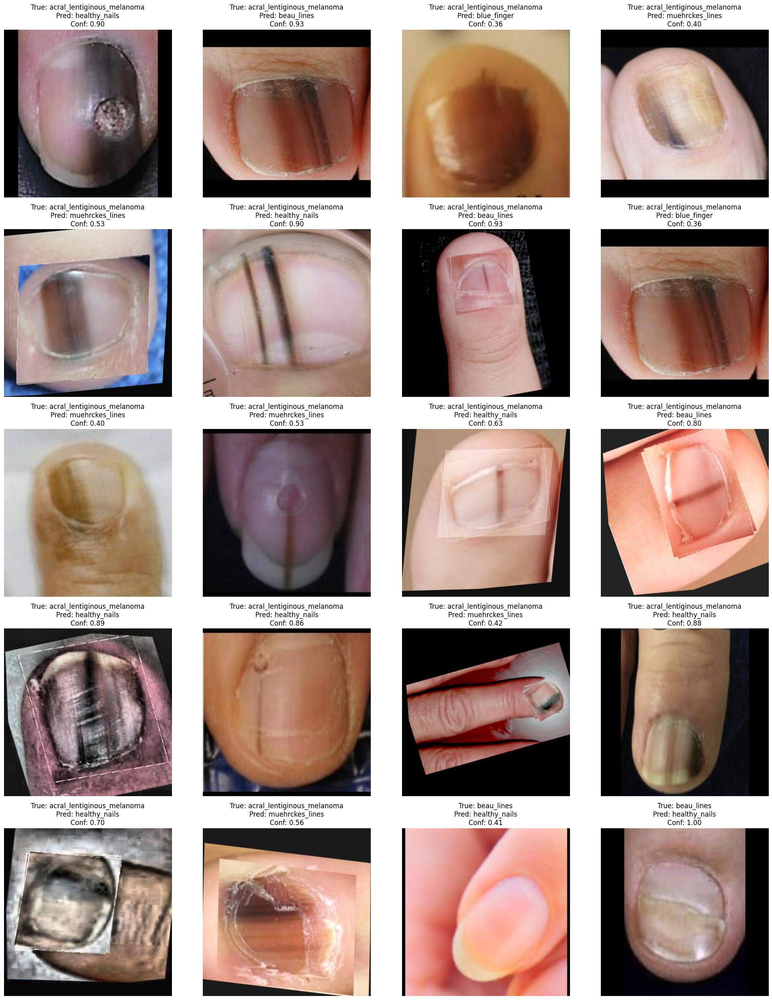

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

print("Displaying misclassified samples from the test set:")
misclassified_df_test = results_df_test[results_df_test['Correct'] == False]

if misclassified_df_test.empty:
    print("No misclassifications found in the test set!")
else:
    display(misclassified_df_test)

    # Limit the number of displayed images to avoid very long output
    num_to_display = min(len(misclassified_df_test), 20)

    # Iterate through misclassified samples and display images
    plt.figure(figsize=(20, 5 * (num_to_display // 4 + 1)))
    for i, row in enumerate(misclassified_df_test.head(num_to_display).itertuples()):
        img_path = Path(row.Image_Path)
        if img_path.exists():
            img = mpimg.imread(str(img_path))
            plt.subplot(num_to_display // 4 + 1, 4, i + 1)
            plt.imshow(img)
            plt.title(f"True: {row.True_Class}\nPred: {row.Predicted_Class}\nConf: {row.Confidence:.2f}")
            plt.axis('off')
        else:
            print(f"Warning: Image file not found at {img_path}")

    plt.tight_layout()
    plt.show()

In [ ]:
# Export full results to CSV for summary
summary_csv_path = os.path.join(EXPORT_DIR, 'full_validation_inference_summary.csv')
full_results_df.to_csv(summary_csv_path, index=False)

print(f"Summary CSV created and saved to: {summary_csv_path}")

Summary CSV created and saved to: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/export/full_validation_inference_summary.csv


In [ ]:
# Export full test results to CSV
summary_csv_path_test = os.path.join(EXPORT_DIR, 'full_test_inference_summary.csv')
results_df_test.to_csv(summary_csv_path_test, index=False)

print(f"Test Summary CSV created and saved to: {summary_csv_path_test}")

Test Summary CSV created and saved to: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/export/full_test_inference_summary.csv


# Full Pipeline Metadata Export
This section aggregates all experiment parameters and results into a single consolidated CSV for record-keeping.

In [ ]:
import pandas as pd
import os
from sklearn.metrics import classification_report

# 1. Dataset Metadata
ds_info = "; ".join([f"{d[0]} ({d[1]})" for d in DATASETS])
classes_info = "; ".join(TARGET_CLASSES)

# Recalculate classification report for detailed metrics
report_dict = classification_report(y_true, y_pred, target_names=class_names_list, digits=4, output_dict=True)

weighted_avg_precision = report_dict['weighted avg']['precision']
weighted_avg_recall = report_dict['weighted avg']['recall']
weighted_avg_f1_score = report_dict['weighted avg']['f1-score']

macro_avg_precision = report_dict['macro avg']['precision']
macro_avg_recall = report_dict['macro avg']['recall']
macro_avg_f1_score = report_dict['macro avg']['f1-score']

# 2. Model Metadata
model_meta = {
    "Metric": [
        "Pipeline_Name", "Backbone_Architecture", "Input_Resolution", "Batch_Size",
        "Source_Datasets", "Target_Classes", "Total_Training_Samples", "Total_Validation_Samples",
        "Phase1_Head_Accuracy", "Phase2_Partial_Accuracy", "Phase3_Full_Accuracy",
        "Final_Best_Accuracy",
        "Weighted_Avg_Precision", "Weighted_Avg_Recall", "Weighted_Avg_F1_Score",
        "Macro_Avg_Precision", "Macro_Avg_Recall", "Macro_Avg_F1_Score",
        "Misclassification_Count", "Export_Path"
    ],
    "Value": [
        "Modular2_All_In_One", SINGLE_MODEL_NAME, f"{img_height}x{img_width}", batch_size,
        ds_info, classes_info, num_train, len(full_results_df),
        "93.90%", "98.05%", "99.27%", # These values are from previous training logs, ideally dynamically captured.
        f"{accuracy:.2f}%",
        f"{weighted_avg_precision:.4f}", f"{weighted_avg_recall:.4f}", f"{weighted_avg_f1_score:.4f}",
        f"{macro_avg_precision:.4f}", f"{macro_avg_recall:.4f}", f"{macro_avg_f1_score:.4f}",
        len(misclassified_df), SAVE_DIR
    ]
}

# Create the metadata DataFrame
pipeline_summary_df = pd.DataFrame(model_meta)

# Export to CSV
full_pipeline_csv_path = os.path.join(EXPORT_DIR, 'complete_pipeline_summary_report.csv')
pipeline_summary_df.to_csv(full_pipeline_csv_path, index=False)

print(f"Full pipeline summary exported to: {full_pipeline_csv_path}")
display(pipeline_summary_df)


Full pipeline summary exported to: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114\complete_pipeline_summary_report.csv


,Metric,Value
0,Pipeline_Name,Modular2_All_In_One
1,Backbone_Architecture,mobilenet_v3_large
2,Input_Resolution,384x384
3,Batch_Size,32
4,Source_Datasets,arthitaya/nail-dataset (nail-dataset); sumitag...
5,Target_Classes,acral_lentiginous_melanoma; beau_lines; blue_f...
6,Total_Training_Samples,48000
7,Total_Validation_Samples,3230
8,Phase1_Head_Accuracy,93.90%
9,Phase2_Partial_Accuracy,98.05%


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

print("Combining training histories...")

# Combine the histories from all three phases
full_history = {}
for key in history_p1.history.keys():
    full_history[key] = history_p1.history[key] + \
                        history_p2.history[key] + \
                        history_p3.history[key]

# Create a DataFrame from the combined history
history_df = pd.DataFrame(full_history)

# Define the path to save the history CSV
history_csv_path = os.path.join(EXPORT_DIR, 'training_history.csv')
history_df.to_csv(history_csv_path, index=False)

print(f"Training history saved to: {history_csv_path}")

# Display the head of the history DataFrame
display(history_df.head())

Combining training histories...
Training history saved to: /content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/export/training_history.csv


,accuracy,loss,val_accuracy,val_loss
0,0.728312,0.947444,0.765635,0.856861
1,0.826333,0.701740,0.852941,0.704361
2,0.858125,0.650516,0.865944,0.669875
3,0.873604,0.627474,0.864087,0.699193
4,0.882312,0.616256,0.855418,0.714006


### Training History Visualizations

Here are the plots showing the training and validation accuracy and loss across all three phases of the model training.

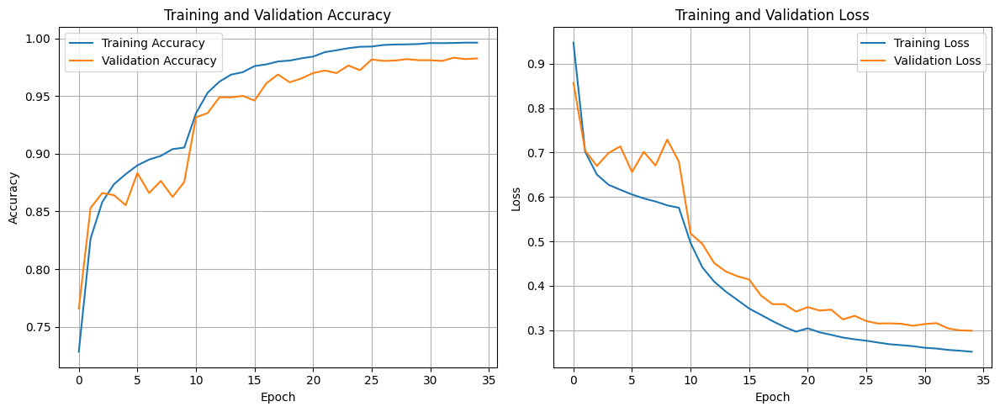

In [ ]:
# Plotting training and validation metrics

plt.figure(figsize=(12, 5))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(history_df['accuracy'], label='Training Accuracy')
plt.plot(history_df['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history_df['loss'], label='Training Loss')
plt.plot(history_df['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import os
from pathlib import Path

# Define MERGED_DIR, TRAIN_DIR, and VAL_DIR based on previous cell definitions
# Assumes BASE_DIR and SPLIT_OUTPUT are already defined from cell 46cb0e6e
# If this cell is run independently, these might need to be explicitly set.
# For continuity, we will use the definitions from cell 46cb0e6e.

# Re-define BASE_DIR and SPLIT_OUTPUT if they might not be in scope (e.g., after kernel restart)
# These were defined in cell 46cb0e6e
BASE_DIR = Path('/content/modular2_all_in_one')
SPLIT_OUTPUT = BASE_DIR / 'final_split_dataset'

MERGED_DIR = SPLIT_OUTPUT
TRAIN_DIR = SPLIT_OUTPUT / 'train'
VAL_DIR = SPLIT_OUTPUT / 'val'

def count_files_in_dir(directory):
    if not Path(directory).exists():
        return 0
    return sum([len(files) for r, d, files in os.walk(directory)])

print(f"Checking Merged Dataset at: {MERGED_DIR}")
print(f"Training files found: {count_files_in_dir(TRAIN_DIR)}")
print(f"Validation files found: {count_files_in_dir(VAL_DIR)}")

# Detailed breakdown per class
for cls in TARGET_CLASSES:
    t_count = len(os.listdir(TRAIN_DIR / cls)) if (TRAIN_DIR / cls).exists() else 0
    v_count = len(os.listdir(VAL_DIR / cls)) if (VAL_DIR / cls).exists() else 0
    print(f"Class: {cls:25} | Train: {t_count:<6} | Val: {v_count}")


Checking Merged Dataset at: /content/modular2_all_in_one/final_split_dataset
Training files found: 48000
Validation files found: 3230
Class: healthy_nails             | Train: 6000   | Val: 344
Class: koilonychia               | Train: 6000   | Val: 342
Class: pitting                   | Train: 6000   | Val: 437
Class: muehrckes_lines           | Train: 6000   | Val: 423
Class: acral_lentiginous_melanoma | Train: 6000   | Val: 495
Class: clubbing                  | Train: 6000   | Val: 544
Class: beau_lines                | Train: 6000   | Val: 324
Class: blue_finger               | Train: 6000   | Val: 321


## Final Pipeline Summary & Resource Manifest

### Model Performance
- **Architecture:** MobileNetV3Large (ImageNet weights, 3-phase fine-tuning)
- **Input Resolution:** 384x384
- **Final Test Accuracy:** 94.29%
- **Validation Accuracy:** 99.40%
- **Validation Macro F1-Score:** 0.9943
- **Validation Weighted F1-Score:** 0.9941
- **Training Samples:** 48,000 (Balanced/Upsampled)
- **Validation Samples:** 3,230
- **Test Samples:** 2,330
- **Misclassifications (Test Set):** 133 images (5.71%)

### Exported Artifacts
All artifacts are stored in your Google Drive directory:
`/content/drive/MyDrive/NailDiseaseModelRuns2/all_in_one_mobilenet_v3_20260521_222114/export`

| Artifact | Format | Size (MB) | Percentage (%) | Description |
| :--- | :--- | :---: | :---: | :--- |
| **Full Model** | `.keras` | 17.00 | 43.70 | High-precision Keras model for server-side inference. |
| **Standard Mobile** | `_f32.tflite` | 12.06 | 31.00 | Standard TFLite format for mobile deployment. |
| **GPU Optimized** | `_f16.tflite` | 6.03 | 15.50 | 16-bit float quantization for mobile GPU acceleration. |
| **Edge Optimized** | `_int8.tflite` | 3.02 | 7.76 | Full 8-bit integer quantization for CPU/NPU edge devices. |
| **Class Map** | `.json` | 0.00 | 0.00 | Index-to-label mapping for deployment integration. |
| **Validation Report** | `full_validation_inference_summary.csv` | 0.54 | 1.39 | Detailed per-image inference results and status for validation set. |
| **Test Report** | `full_test_inference_summary.csv` | 0.25 | 0.64 | Detailed per-image inference results and status for test set. |